# Multidimensional (N-d) Arrays: xarray, ERA5 Climate reanalysis

# Notebook #1: Intro and Global Climatology

UW Geospatial Data Analysis  
CEE498/CEWA599  
David Shean  

## Objectives
* Introduce xarray data model for N-d array analysis
* Practice basic N-d array slicing, grouping and aggregation
* Explore global and local climate reanalysis data

## Discussion
* Can use these as input variables for analysis in your projects
    * correlating lake area with surface T evolution

## Introduction

This week we are going to do some basic analysis of climate reanalysis data.

We will use a few different products from the state-of-the-art ERA5 reanalysis, which currently span 1979-present with hourly timestep at 1/4° grid resolution (~30 km). Future releases will extent the record back to 1950.

We will use xarray to open, combine, analyze and plot the data.

## xarray

Take a moment to review this high-level introduction:
* http://xarray.pydata.org/en/stable/why-xarray.html

>"Xarray introduces labels in the form of dimensions, coordinates and attributes on top of raw NumPy-like multidimensional arrays, which allows for a more intuitive, more concise, and less error-prone developer experience."

It's also an excellent choice for working with large datasets, as it uses lazy evaluation and parallel processing with Dask: http://xarray.pydata.org/en/stable/dask.html#

So, what's an nD array? (https://docs.scipy.org/doc/numpy-1.13.0/reference/arrays.ndarray.html)  You've been using them all quarter, but mostly 1D and 2D NumPy arrays.  

As with many of the packages we've covered this quarter, vocabulary can be one of the biggest blocks to learning.  Let's discuss.

## DataSet overview
![xarray image with labels](http://matthewrocklin.com/blog/images/xarray-boxes-2.png)
(http://xarray.pydata.org/en/latest/data-structures.html#dataset)

### Comparison with Pandas

Pandas is very good at handling 2D tabular datasets (e.g., csv with columns and rows, time series of met station variables from a single station [T, precip, etc]).  
* "If your data fits nicely into a pandas DataFrame then you’re better off using one of the more developed tools there." (http://xarray.pydata.org/en/v0.7.2/plotting.html)
* "pandas excels at working with tabular data. That suffices for many statistical analyses, but physical scientists rely on N-dimensional arrays – which is where xarray comes in." (http://xarray.pydata.org/en/stable/why-xarray.html#goals-and-aspirations)

xarray extends the Pandas functionality to support 3+ dimensions (e.g., time series of 2D rasters).

#### xarray is to Pandas...

* xarray DataArray : Pandas DataSeries
* xarray DataSet : Pandas DataFrame

### DataArray
Four essential pieces:
* `values`: a numpy.ndarrays with actual data values (e.g., ('t2m', 'tp')
* `dims`: dimension names for each axis (e.g., ('lon', 'lat', 'time'))
* `coords`: a dict-like container of arrays (coordinates) that label each point (e.g., 1-dimensional arrays of numbers, datetime objects or strings)
* `attrs`: an OrderedDict containing additional metadata (attributes)

### Dataset
* Essentially, a collection of DataArrays (like a dictionary of DataArrays)
* http://xarray.pydata.org/en/latest/data-structures.html#dataset

Notes:
* One value in one of the contained arrays (say a single temperature measurement) usually has multiple coordinates ('lon', 'lat', 'time')

### Essential xarray examples and references
* Indexing and selection: http://xarray.pydata.org/en/stable/index.html
* Plotting: http://xarray.pydata.org/en/stable/plotting.html
* Visualization examples: http://xarray.pydata.org/en/stable/examples/visualization_gallery.html
* Time-series analysis: http://xarray.pydata.org/en/stable/time-series.html
* https://rabernat.github.io/research_computing/xarray.html

## netCDF format

* https://en.wikipedia.org/wiki/NetCDF
* https://www.unidata.ucar.edu/software/netcdf/

## ERA5 Reanalysis Data

ERA5 = "ECMWF ReAnalysis 5"  
ECMWF = "European Centre for Medium-Range Weather Forecasts"

"ERA5 provides hourly estimates of a large number of atmospheric, land and oceanic climate variables. The data cover the Earth on a 30km grid and resolve the atmosphere using 137 levels from the surface up to a height of 80km."

"ERA5 combines vast amounts of historical observations into global estimates using advanced modelling and data assimilation systems."

* https://confluence.ecmwf.int/display/CKB/What+is+ERA5

### Variables
Hundreds of output variables for each hourly timestep. See a list of all of the available variables:
* https://apps.ecmwf.int/codes/grib/param-db

### Resolution
The ERA5 HRES (High Resolution) data has a native resolution of 0.28125 degrees (31km)
* https://confluence.ecmwf.int/display/CKB/ERA5%3A+What+is+the+spatial+reference

In [129]:
#For one variable, total number of grid cells for full 70 year record at hourly resolution
360*180*4*4*137*24*365.25*70

87159566592000.0

### Data Availability
For this lab, I prepared some sample datasets.  
**Please run the `09_NDarrays_xarray_ERA5_Part0_download.ipynb` notebook to download and prepare these files!**.

#### From CDS (Climate Data Store)
For future reference, you can access the ERA5 data directly!  The CDS API allows you to request subsets of ERA5 products for desired spatial extent, time periods, time intervals, etc.:
* https://cds.climate.copernicus.eu/api-how-to
* https://confluence.ecmwf.int/display/CKB/How+to+download+ERA5

#### Some commonly used products are also available on Amazon S3
* https://registry.opendata.aws/ecmwf-era5/

## OK, let's get started with the data analysis already!

In [1]:
import os
from glob import glob
import numpy as np
import xarray as xr
import pandas as pd
import geopandas as gpd
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

## Get the WA state outline

In [2]:
#states_url = 'http://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_5m.json'
states_url = 'http://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_500k.json'
states_gdf = gpd.read_file(states_url)

In [3]:
wa_state = states_gdf.loc[states_gdf['NAME'] == 'Washington']

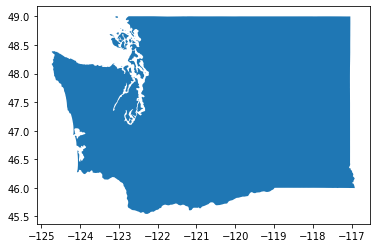

In [4]:
wa_state.plot();

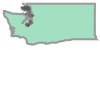

In [5]:
wa_geom = wa_state.iloc[0].geometry
wa_geom

In [6]:
wa_bounds = wa_state.total_bounds
wa_bounds

array([-124.733174,   45.543541, -116.915989,   49.002494])

In [7]:
def myround(x, base=0.25):
    return base * np.round(x/base)

def roundbounds(bounds, base=0.25):
    bounds_floor = np.floor(wa_bounds/base)*base
    bounds_ceil = np.ceil(wa_bounds/base)*base
    return [bounds_floor[0], bounds_floor[1], bounds_ceil[2], bounds_ceil[3]]

In [8]:
wa_rbounds = roundbounds(wa_bounds)
wa_rbounds

[-124.75, 45.5, -116.75, 49.25]

# Part 1: Global climatology
## Monthly temperature from 1979-2021
* Two datasets are provided:
    1. Climatology - long-term mean monthly values ofrom 1979-2021 (12 grids)
    2. Anomaly - monthly difference from long-term monthly mean (505 grids from 1979-2021)
* https://cds.climate.copernicus.eu/cdsapp#!/dataset/ecv-for-climate-change?tab=overview
* http://datastore.copernicus-climate.eu/c3s/published-forms/c3sprod/ecv-for-climate-change/PUG-ecv-for-climate-change.pdf

In [9]:
%pwd

'/home/jovyan/gda_course_2021_solutions/modules/09_NDarrays_xarray_ERA5'

## Open the processed global monthly temperature anomaly and climatology NetCDF files
* See relevant doc on opening and writing files: http://xarray.pydata.org/en/stable/io.html
* Note that processing and saving the anomalies could take some time, as you're reading in 480 files and saving a large nc file
* Take a moment to review the steps in the `grib2nc` function of the download notebook, and review the io doc for xarray
    * Note the `open_dataset` and `concat` functions

In [10]:
out_fn = 'era5_data/ecv-for-climate-change/climatology_0.25g_ea_2t.nc'
t_clim_ds = xr.open_dataset(out_fn)

In [11]:
out_fn = 'era5_data/ecv-for-climate-change/1month_anomaly_Global_ea_2t.nc'
t_anom_ds = xr.open_dataset(out_fn)

## Inspect the DataSets
* Discuss with your neighbor
* Review the output of the `info()` method
* Note the number of time entries in each DataSet
* What are the min and max longitude, min and max latitude
* Note: The timestamp listed in the climatology dataset for each month is arbitrarily listed as 2018 (e.g., '2018-01-01')
    * Remember these are mean values for each month of the year (12 total) across the entire 1979-2021 period
* print info for the 't2m' DataArray (temperature 2 m above ground)

In [12]:
t_clim_ds

<xarray.Dataset>
Dimensions:    (latitude: 721, longitude: 1440, time: 12)
Coordinates:
  * time       (time) datetime64[ns] 1981-01-01 1981-02-01 ... 1981-12-01
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float64 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
Data variables:
    t2m        (time, latitude, longitude) float32 ...
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2021-03-05T18:48:23 GRIB to CDM+CF via cfgrib-0....

In [13]:
t_anom_ds

<xarray.Dataset>
Dimensions:    (latitude: 721, longitude: 1440, time: 505)
Coordinates:
  * time       (time) datetime64[ns] 1979-01-01 1979-02-01 ... 2021-01-01
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float64 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
Data variables:
    t2m        (time, latitude, longitude) float32 ...
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2021-03-05T18:49:04 GRIB to CDM+CF via cfgrib-0....

## Side Note: Preparing climatology and anomaly DataSets
* The `ecv-for-climate-change` dataset includes prepared climatology and monthly anomalies for each month between Jan 1979 and Jan 2021
* See here for explanation of how they are calculated with xarray: http://xarray.pydata.org/en/stable/examples/weather-data.html#Calculate-monthly-anomalies
* http://xarray.pydata.org/en/latest/examples/monthly-means.html
* Below is a reproduction of how you could prepare these yourself if all you had were the monthly mean values for each month between Jan 1979 and Jan 2021

In [34]:
#out_fn = 'era5_data/ecv-for-climate-change/1month_mean_Global_ea_2t.nc'
#t_mean_ds = xr.open_dataset(out_fn)

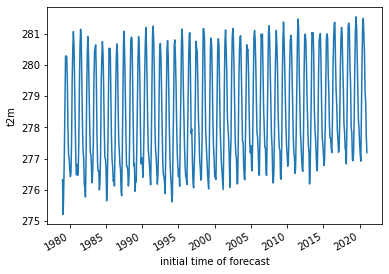

In [35]:
#t_mean_ds['t2m'].mean(dim=('latitude', 'longitude')).plot();

#### Compute mean value for each month across all years
* Start with a `groupby` for each of the 12 months, then take the mean in the time dimension

In [36]:
#climatology = t_mean_ds.groupby("time.month").mean("time")

#### Compute anomaly by removing these values from time series of monthly mean values
* Note that this reduces the time dimension of the DataArray to integer for each month, dropping the '1981-01-01', '1981-02-01' labels in the ecv climatology dataset

In [37]:
#anomalies = t_mean_ds.groupby("time.month") - climatology

In [40]:
#climatology['t2m'].month

<xarray.DataArray 'month' (month: 12)>
array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

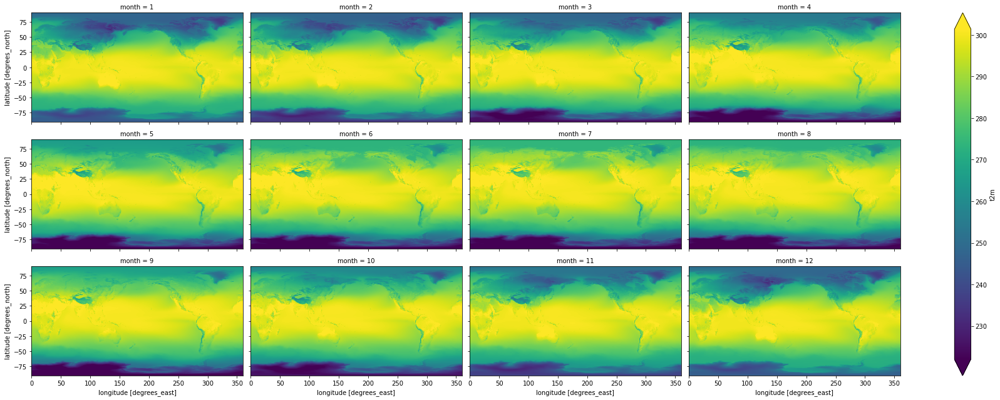

In [55]:
#(climatology['t2m']).plot(col='month', col_wrap=4, aspect=2, robust=True);

*DES Note: I see some offsets in temperature values between our climatology and the ecv values. Need to explore further* 

In [53]:
#climatology['t2m'].values[0,0]

array([247.95518, 247.95518, 247.95518, ..., 247.95518, 247.95518,
       247.95518], dtype=float32)

In [54]:
#t_clim_ds['t2m'].values[0,0]

array([247.47934, 247.47934, 247.47934, ..., 247.47934, 247.47934,
       247.47934], dtype=float32)

### How much memory would we expect the climatology and anomaly DataArray occupy in RAM? Is this consistent with observed usage?
* Want to check `dtype` here

## Convert the temperature values from K to C for the climatology dataset
* Note: don't need to do this for anomalies, as they are relative values, not absolute
* These operations are done on the DataArray level (not the top-level DataSet object level), so you'll need to modify `t_clim_ds['t2m']`
    * You can use `-=` syntax here
    * Or, update the `t_clim_ds['t2m'].values`
* Make sure you also update the units
    * The units used by xarray are stored in the t_clim_ds['t2m'].attrs dictionary
    * There is also a GRIB units variable, but this is holdover from the grib to xarray conversion
* Sanity check values

## Set the longitude values to be (-180 to 180) instead of (0 to 360)

In [19]:
def ds_swaplon(ds):
    return ds.assign_coords(longitude=(((ds.longitude + 180) % 360) - 180)).sortby('longitude')

In [20]:
t_clim_ds = ds_swaplon(t_clim_ds)

In [21]:
t_anom_ds = ds_swaplon(t_anom_ds)

In [22]:
t_clim_ds.longitude

<xarray.DataArray 'longitude' (longitude: 1440)>
array([-180.  , -179.75, -179.5 , ...,  179.25,  179.5 ,  179.75])
Coordinates:
  * longitude  (longitude) float64 -180.0 -179.8 -179.5 ... 179.2 179.5 179.8

## Create a Facet plot showing temperature grids for each month in the climatology DataSet
* http://xarray.pydata.org/en/stable/plotting.html#faceting
* Make sure your units are correct in the colorbar
* Take a moment to admire this, look at seasonal cycles

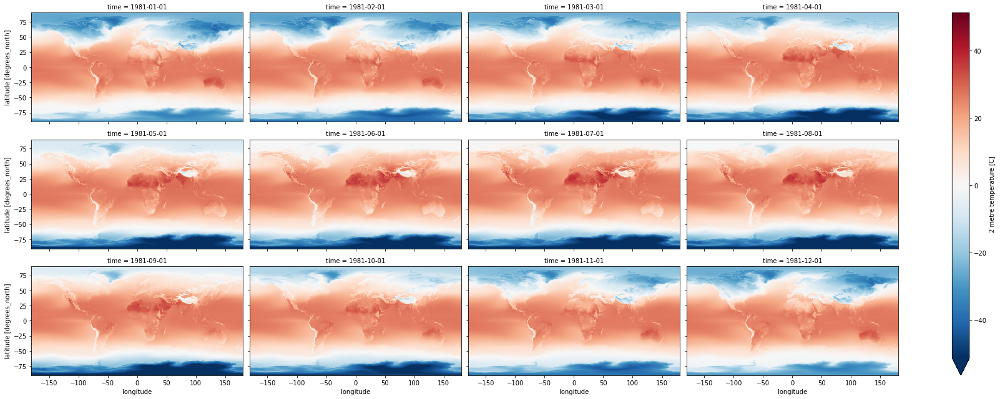

## Use Holoviz for interactive plotting
* Multiple plotting backends can be used with xarray
    * We previously used Seaborn, and folium/ipyleaflet for interactive maps
* Still under development, but `hvplot` is flexible and powerful:
    * https://holoviz.org/

In [24]:
import hvplot.xarray 

#### Create interactive plot with hvplot()
* Note how coordinates and values are interactively displayed as you move your cursor over the plot
* Experiment with time slider on right side
* Experiment with zoom/pan capability

In [25]:
t_clim_ds['t2m'].hvplot(x='longitude',y='latitude', cmap='RdBu_r', clim=(-50,50))

:DynamicMap   [time]
   :Image   [longitude,latitude]   (t2m)

## Isolate the August array and plot
* Review different strategies for selection here: http://xarray.pydata.org/en/stable/indexing.html
* Use the `isel` method with dimension name and integer index (`time=7`)
* Use the `sel` method with dimension name and label (`time='2016-08-01'`)

In [26]:
#See time dimension index
t_clim_ds.time

<xarray.DataArray 'time' (time: 12)>
array(['1981-01-01T00:00:00.000000000', '1981-02-01T00:00:00.000000000',
       '1981-03-01T00:00:00.000000000', '1981-04-01T00:00:00.000000000',
       '1981-05-01T00:00:00.000000000', '1981-06-01T00:00:00.000000000',
       '1981-07-01T00:00:00.000000000', '1981-08-01T00:00:00.000000000',
       '1981-09-01T00:00:00.000000000', '1981-10-01T00:00:00.000000000',
       '1981-11-01T00:00:00.000000000', '1981-12-01T00:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 1981-01-01 1981-02-01 ... 1981-12-01
Attributes:
    long_name:      initial time of forecast
    standard_name:  forecast_reference_time

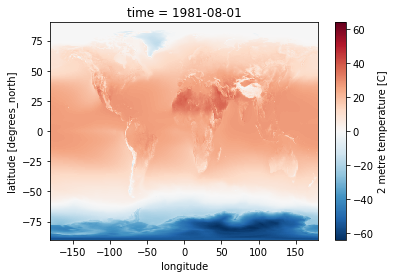

## Create a plot for August, overlaying coastlines with cartopy
Use a simple PlateCaree() projection as in example here:
* https://scitools.org.uk/cartopy/docs/v0.15/matplotlib/intro.html

Once you have your axes setup, you should be able to plot with xarray easily (pass the axes object to `plot()` function:
* http://xarray.pydata.org/en/stable/plotting.html#maps  
Don't use a discrete color ramp as in some of the examples, use a continuous linear color ramp, as in the facet plot.

Note how 2-m temperature varies with elevation (e.g., see the Tibetan Plateau)

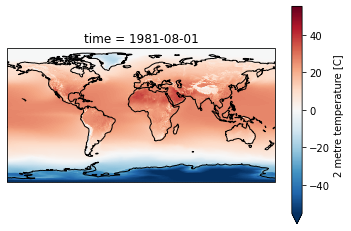

In [30]:
f = plt.figure()
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines() 
t_clim_ds['t2m'].sel(time=ts).plot(ax=ax, robust=True);

## Clip to WA state

In [31]:
wa_rbounds

[-124.75, 45.5, -116.75, 49.25]

In [32]:
t_clim_ds_wa = t_clim_ds.sel(latitude=slice(wa_rbounds[3],wa_rbounds[1]), longitude=slice(wa_rbounds[0],wa_rbounds[2]))

In [33]:
t_anom_ds_wa = t_anom_ds.sel(latitude=slice(wa_rbounds[3],wa_rbounds[1]), longitude=slice(wa_rbounds[0],wa_rbounds[2]))

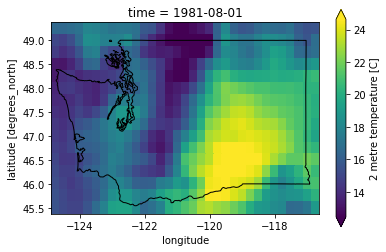

In [34]:
f, ax = plt.subplots()
t_clim_ds_wa['t2m'].sel(time=ts).plot(ax=ax, robust=True);
wa_state.plot(ax=ax, edgecolor='k', facecolor='none');

## Extra credit: Compute linear temperature trend for WA state

In [36]:
#The difference along the time axis will return values in timedelta64[ns]
#We want degrees per year
#Input timestep is monthly
#Nanoseconds per month (avg)
dt_factor = 1E9 * 2628288

In [37]:
fit = t_anom_ds_wa['t2m'].polyfit(dim='time', deg=1)['polyfit_coefficients']
fit['degree'==1] *= dt_factor * 12

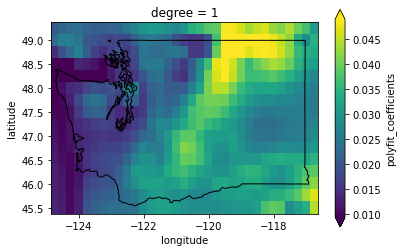

In [38]:
f, ax = plt.subplots()
fit.sel(degree=1).plot(ax=ax, robust=True);
wa_state.plot(ax=ax, edgecolor='k', facecolor='none');

## Create line plot of global monthly temperature
* Compute the mean of the climatology t2m DataArray across the spatial dimensions (can use `dim=('latitude', 'longitude')` for this)

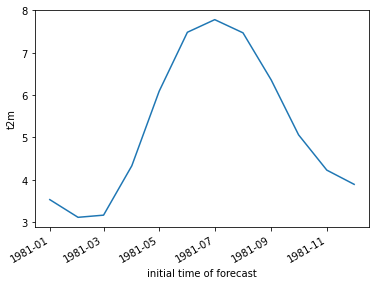

## Create 2D plots showing mean temperature vs. latitude (averaged over all longitudes)

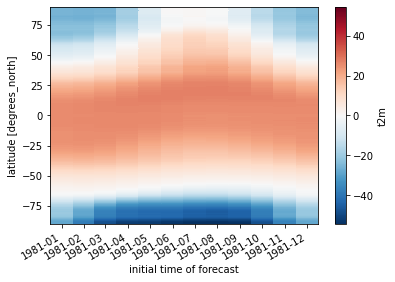

## Create line plots of mean zonal and meridional temperature
* https://en.wikipedia.org/wiki/Zonal_and_meridional
* Hint: specify a tuple of appropriate dimensions for the `dim` keyword when computing `mean()`
    * Above we used `dim=('latitude', 'longitude')` to average all latitudes and longitudes, plotting the resulting values over time
    * Now in the zonal mean case, we want to average for all latitudes and times, plotting resulting values vs. longitude
* Create as figure with two subplots: meridional mean T and zonal mean T
* Add titles accordingly

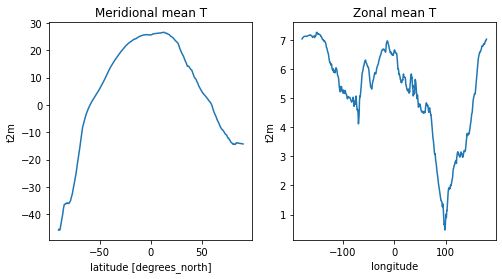

## Create a plot showing monthly mean temperature for the Arctic and Antarctic
* See location indexing here: http://xarray.pydata.org/en/stable/indexing.html#assigning-values-with-indexing
* One approach:
    * Create boolean index arrays for `t_clim_ds['latitude']` coordinate for relevant latitude ranges
        * Use Arctic circle and Antarctic circle as a threshold
            * https://en.wikipedia.org/wiki/Arctic_Circle
    * Use the index array with xarray `where` method on the `t_clim_ds['t2m']` DataArray
        * Make sure to use `drop=True` to avoid unnecessarily storing lots of nan values in memory
    * Compute the mean across all returned lat/lon grid cells
* Note the magnitude and phase of the seasonal temperature varability at the opposite poles

In [42]:
polar_lat = 66.5
#arctic_idx = slice(polar_lat,90)
arctic_idx = (t_clim_ds['latitude'] >= polar_lat)
antarctic_idx = (t_clim_ds['latitude'] <= -polar_lat)
nonpolar_idx = (t_clim_ds['latitude'] < polar_lat) & (t_clim_ds['latitude'] > -polar_lat)

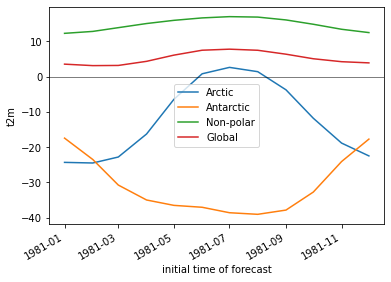

## Extra Credit: Repeat the above analysis, isolating land and ocean classes
* Hint: can use `rioxarray` for clipping using a GeoDataFrame or geometry

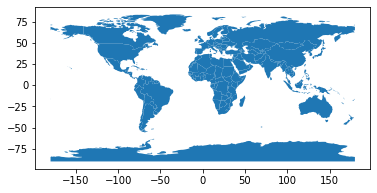

In [48]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
#Hack to set to latest PROJ syntax, instead of 'init'
world.crs = 'EPSG:4326'
world.plot();

## Use simple `clip` function in `rioxarray` here
* Code and documentation is still under development, but you can read more here:
    * https://corteva.github.io/rioxarray/stable/getting_started/getting_started.html
    * https://corteva.github.io/rioxarray/stable/examples/clip_geom.html

In [50]:
import rioxarray

In [51]:
t_clim_ds.rio.write_crs(world.crs, inplace=True);

In [52]:
#Mask values over ocean
t_clim_ds_land = t_clim_ds['t2m'].rio.clip(world.geometry, crs=world.crs, drop=False)
#Invert to mask values over land
t_clim_ds_ocean = t_clim_ds['t2m'].rio.clip(world.geometry, crs=world.crs, drop=False, invert=True)

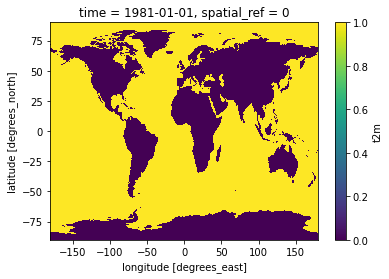

In [54]:
#Preview land mask
t_clim_ds_land.isel(time=0).isnull().plot();

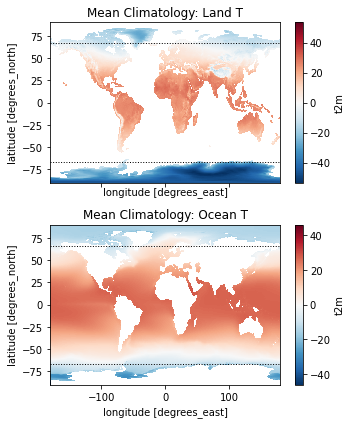

In [55]:
f, axa = plt.subplots(2,1, sharex=True, sharey=True, figsize=(5,6))
t_clim_ds_land.mean(dim='time').plot(ax=axa[0], cmap='RdBu_r', clim=(-50,50))
t_clim_ds_ocean.mean(dim='time').plot(ax=axa[1], cmap='RdBu_r', clim=(-50,50))
axa[0].set_title('Mean Climatology: Land T')
axa[1].set_title('Mean Climatology: Ocean T')
kwargs = dict(color='k', lw=1.0, ls=':')
axa[0].axhline(polar_lat, **kwargs)
axa[0].axhline(-polar_lat, **kwargs)
axa[1].axhline(polar_lat, **kwargs)
axa[1].axhline(-polar_lat, **kwargs)
plt.tight_layout()

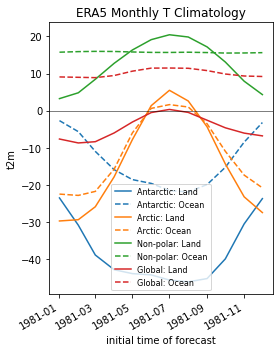

# Temporal Variability: Anomalies

I heard somewhere that climate change was a hoax.  Let's check.

To do this, we will use the monthly anomalies from 1979-present.

## Create a line plot of mean global monthly temperature anomaly from 1979-present
* This should be a simple one-liner
* Note: if you used xarray's default lazy load of the `nc` file, and this is the first time reading the entire `t_anom_ds` from disk, this may take ~20 seconds

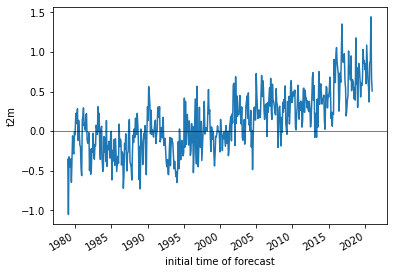

## Did the Arctic and Antarctic warm at the same rate over the past 40 years?
* Create a quick line plot showing anomalies for each region, you can reuse indices from above

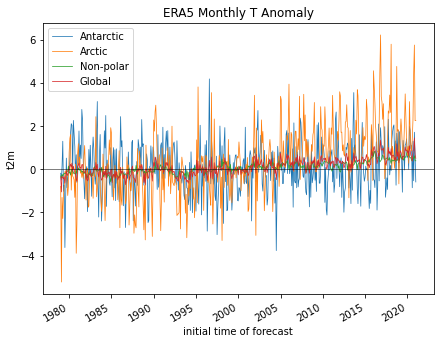

## Extra credit: compute linear temperature trend at each pixel and create a map with coastlines
* Note: can coarsen the data to 1x1° to improve performance (16x!)

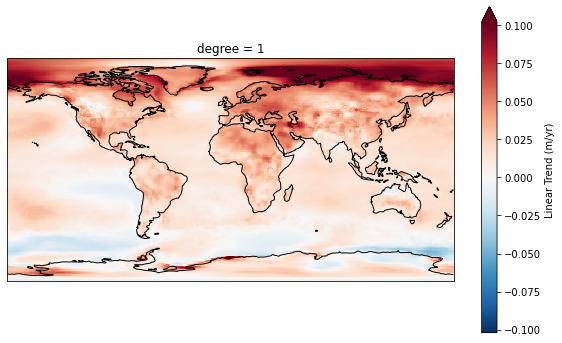

## Extra credit: Group temperature anomalies by decade
* See pandas/xarray `resample` function
* Relevant aliases: https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#dateoffset-objects
* How does the most recent decade compare with the first decade in the time series?
    * Note that most first and last decade in the record might not be "complete" with 10 full years

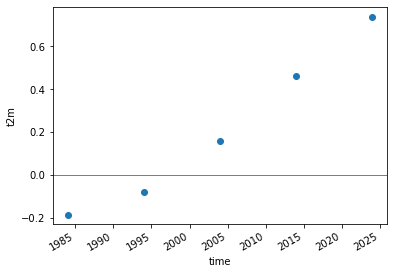